In [1]:
import torch
import torch.nn as nn
from torchsummary import summary
import torchvision
import torchvision.transforms as transforms

In [2]:
import numpy as np

In [3]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size, padding=1, stride=1)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size, padding=1)
        self.bn1 = nn.BatchNorm2d(num_features=out_channels)
        self.bn2 = nn.BatchNorm2d(num_features=out_channels)
        self.relu = nn.ReLU(inplace=True)
        
        self.trans = nn.Conv2d(in_channels, out_channels, kernel_size=1)
        
    def forward(self, x):
        print(x.shape)
        f_x = self.conv1(x)
        f_x = self.bn1(f_x)
        f_x = self.relu(f_x)
        f_x = self.conv2(f_x)
        f_x = self.bn2(f_x)
        print(f_x.shape)
        
        x = self.trans(x)
        
        x = f_x + x
        x = self.relu(x)
        return x

In [4]:
tmp = ResidualBlock(3, 20)

In [5]:
tmp

ResidualBlock(
  (conv1): Conv2d(3, 20, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(20, 20, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm2d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (trans): Conv2d(3, 20, kernel_size=(1, 1), stride=(1, 1))
)

In [6]:
summary(tmp, (3, 32, 32))

torch.Size([2, 3, 32, 32])
torch.Size([2, 20, 32, 32])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 20, 32, 32]             560
       BatchNorm2d-2           [-1, 20, 32, 32]              40
              ReLU-3           [-1, 20, 32, 32]               0
            Conv2d-4           [-1, 20, 32, 32]           3,620
       BatchNorm2d-5           [-1, 20, 32, 32]              40
            Conv2d-6           [-1, 20, 32, 32]              80
              ReLU-7           [-1, 20, 32, 32]               0
Total params: 4,340
Trainable params: 4,340
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.01
Forward/backward pass size (MB): 1.09
Params size (MB): 0.02
Estimated Total Size (MB): 1.12
----------------------------------------------------------------


In [7]:
np.random.random((1,2))

array([[0.5728837 , 0.05357506]])

In [8]:
b1 = nn.Sequential(nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3),
                   nn.BatchNorm2d(64), nn.ReLU(),
                   nn.MaxPool2d(kernel_size=3, stride=2, padding=1))

In [9]:
def resnet_block(in_channels, out_channels, num_residuals,
                 first_block=False):
    blk = []
    for i in range(num_residuals):
        if i == 0 and not first_block:
            blk.append(ResidualBlock(in_channels, out_channels))
        else:
            blk.append(ResidualBlock(out_channels, out_channels))
    return blk

In [10]:
#add the module to resnet. 2 residual blocks are used.
b2 = nn.Sequential(*resnet_block(64, 64, 2, first_block=True))
b3 = nn.Sequential(*resnet_block(64, 128, 2))
b4 = nn.Sequential(*resnet_block(128, 256, 2))
b5 = nn.Sequential(*resnet_block(256, 512, 2))

In [11]:
net = nn.Sequential(b1, b2, b3, b4, b5,
                    nn.AdaptiveMaxPool2d((1,1)),
                    nn.Flatten(), nn.Linear(512, 10))

In [12]:
summary(net, (3,32,32))

torch.Size([2, 64, 8, 8])
torch.Size([2, 64, 8, 8])
torch.Size([2, 64, 8, 8])
torch.Size([2, 64, 8, 8])
torch.Size([2, 64, 8, 8])
torch.Size([2, 128, 8, 8])
torch.Size([2, 128, 8, 8])
torch.Size([2, 128, 8, 8])
torch.Size([2, 128, 8, 8])
torch.Size([2, 256, 8, 8])
torch.Size([2, 256, 8, 8])
torch.Size([2, 256, 8, 8])
torch.Size([2, 256, 8, 8])
torch.Size([2, 512, 8, 8])
torch.Size([2, 512, 8, 8])
torch.Size([2, 512, 8, 8])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 16, 16]           9,472
       BatchNorm2d-2           [-1, 64, 16, 16]             128
              ReLU-3           [-1, 64, 16, 16]               0
         MaxPool2d-4             [-1, 64, 8, 8]               0
            Conv2d-5             [-1, 64, 8, 8]          36,928
       BatchNorm2d-6             [-1, 64, 8, 8]             128
              ReLU-7             [-1, 64, 8, 8]             

In [15]:
X = torch.rand(size=(3, 3, 224, 224))
for layer in net:
    X = layer(X)
    print(layer.__class__.__name__,'output shape:\t', X.shape)

Sequential output shape:	 torch.Size([3, 64, 56, 56])
torch.Size([3, 64, 56, 56])
torch.Size([3, 64, 56, 56])
torch.Size([3, 64, 56, 56])
torch.Size([3, 64, 56, 56])
Sequential output shape:	 torch.Size([3, 64, 56, 56])
torch.Size([3, 64, 56, 56])
torch.Size([3, 128, 56, 56])
torch.Size([3, 128, 56, 56])
torch.Size([3, 128, 56, 56])
Sequential output shape:	 torch.Size([3, 128, 56, 56])
torch.Size([3, 128, 56, 56])
torch.Size([3, 256, 56, 56])
torch.Size([3, 256, 56, 56])
torch.Size([3, 256, 56, 56])
Sequential output shape:	 torch.Size([3, 256, 56, 56])
torch.Size([3, 256, 56, 56])
torch.Size([3, 512, 56, 56])
torch.Size([3, 512, 56, 56])
torch.Size([3, 512, 56, 56])
Sequential output shape:	 torch.Size([3, 512, 56, 56])
AdaptiveMaxPool2d output shape:	 torch.Size([3, 512, 1, 1])
Flatten output shape:	 torch.Size([3, 512])
Linear output shape:	 torch.Size([3, 10])


In [16]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=4,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=4,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

Files already downloaded and verified
Files already downloaded and verified


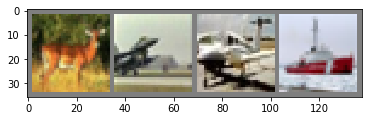

 deer plane plane  ship


In [17]:
import matplotlib.pyplot as plt

# functions to show an image


def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


# get some random training images
dataiter = iter(trainloader)
images, labels = dataiter.next()

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [18]:
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

In [19]:
for epoch in range(2):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 2000 == 1999:    # print every 2000 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 2000))
            running_loss = 0.0

print('Finished Training')

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

[1,  2000] loss: 2.261
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

[1,  4000] loss: 2.024
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

[1,  6000] loss: 1.843
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

[1,  8000] loss: 1.737
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

[1, 10000] loss: 1.627
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

[1, 12000] loss: 1.574
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

[2,  2000] loss: 1.490
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

[2,  4000] loss: 1.422
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

[2,  6000] loss: 1.381
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

[2,  8000] loss: 1.310
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

[2, 10000] loss: 1.283
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

[2, 12000] loss: 1.239
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

Finished Training


In [20]:
PATH = './cifar_net.pth'
torch.save(net.state_dict(), PATH)

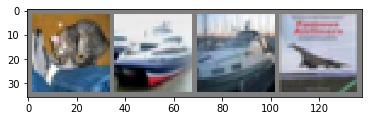

GroundTruth:    cat  ship  ship plane


In [21]:
dataiter = iter(testloader)
images, labels = dataiter.next()

# print images
imshow(torchvision.utils.make_grid(images))
print('GroundTruth: ', ' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [23]:
# net = Net()
net.load_state_dict(torch.load(PATH))

<All keys matched successfully>

In [24]:
outputs = net(images)

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])


In [25]:
_, predicted = torch.max(outputs, 1)

print('Predicted: ', ' '.join('%5s' % classes[predicted[j]]
                              for j in range(4)))


Predicted:    cat truck  ship plane


In [26]:
correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data
        outputs = net(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the 10000 test images: %d %%' % (
    100 * correct / total))

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4,

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4,

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size(

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4,

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4,

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4,

In [28]:
class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))
with torch.no_grad():
    for data in testloader:
        images, labels = data
        outputs = net(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(4):
            label = labels[i]
            class_correct[label] += c[i].item()
            class_total[label] += 1


for i in range(10):
    print('Accuracy of %5s : %2d %%' % (
        classes[i], 100 * class_correct[i] / class_total[i]))

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size(

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4,

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size(

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 1

torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 

torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 128, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 256, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 512, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4, 64, 8, 8])
torch.Size([4

In [1]:
!git remote add origin https://github.com/jacedang/resnet.git